# UMAP vs. Ivis Evaluation

In [1]:
%cd /home/dfoose/notebooks/UMAP_Ivis

/home/dfoose/notebooks/UMAP_Ivis


## Imports and function definitions

In [2]:
from ivis import Ivis
from cuml import UMAP
import time
import tensorflow as tf
import pandas as pd
#from sklearn.preprocessing import StandardScaler
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

### Rigid motion alignment

In [3]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils import check_array
from sklearn.utils.validation import check_is_fitted, column_or_1d
import numpy as np


def rigid_motion_alignment(P, Q, sample_weight=None):
    if sample_weight is None:
        sample_weight = np.ones(P.shape[1])
    p_centroid = np.sum(sample_weight * P, axis=1) / np.sum(sample_weight)
    q_centroid = np.sum(sample_weight * Q, axis=1) / np.sum(sample_weight)
    X = P - p_centroid.reshape(-1, 1)
    Y = Q - q_centroid.reshape(-1, 1)
    S = np.dot(X * sample_weight, Y.T)
    U, s, V = np.linalg.svd(S, full_matrices=False)
    V = V.T  # np.linalg.svd returns vh, which is V.T
    s = np.ones(s.shape)
    s[-1] = np.linalg.det(np.dot(V, U.T))
    R = np.dot(V * s, U.T)
    t = q_centroid - np.dot(R, p_centroid)
    return R, t


class RigidMotionAlignment(BaseEstimator, TransformerMixin):
    """Rigid motion alignment of two matrices
    Calculate and apply a rigid transformation that optimally aligns two sets of corresponding points in the least
    squares sense (https://igl.ethz.ch/projects/ARAP/svd_rot.pdf)

    Attributes
    ----------
    R_: The rotation matrix
    t_: The translation matrix
    """
    def __init__(self):
        self.R_ = None
        self.t_ = None

    def fit(self, X, Y, sample_weight=None):
        """Find the rotation and translation matrices.

        Parameters
        ----------
        X : array-like, shape = [n_samples, n_features]
            The data to be aligned.
        Y : array-like, shape = [n_samples, n_features]
            Data to which X should be aligned.
        """
        X = check_array(X)
        Y = check_array(Y)
        if X.shape != Y.shape:
            raise ValueError('X and y must be sets of corresponding points with the same dimensions.')
        if sample_weight is not None:
            sample_weight = column_or_1d(sample_weight)
        self.R_, self.t_ = rigid_motion_alignment(np.transpose(X), np.transpose(Y), sample_weight)
        return self

    def transform(self, X):
        """Rotate X using the rotation and translation matrices found by fit()

        Parameters
        ----------
        X : array-like, shape = [n_samples, n_features]
            The data to be aligned
        
        Returns
        -------
        X_rot, a rigidly transformed X which is closest to the Y from fit() in the least-squares sense.
        """
        X = check_array(X)
        check_is_fitted(self, 'R_')
        return np.dot(self.R_, np.transpose(X)).T + self.t_
    

### Plot.ly plot function

In [4]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout
import plotly
import plotly.graph_objs as go
import plotly.io as pio
pio.renderers.default = "jupyterlab"


init_notebook_mode(connected=False)


def plot_embeddings(embeddings, label, filename, title):
    if not isinstance(embeddings, pd.DataFrame):
        embeddings_df = pd.DataFrame(columns=['x', 'y'], data=embeddings)
    else:
        embeddings_df = embeddings
    if label is not None and 'class' not in embeddings_df.columns:
        embeddings_df['class'] = label
    else:
        embeddings_df['class'] = np.ones(len(embeddings))
    data = [
        go.Scatter(
            x = embeddings_df[embeddings_df['class']==class_val]['x'],
            y = embeddings_df[embeddings_df['class']==class_val]['y'],
            mode = 'markers',
            name=str(class_val)
        )
        for class_val in sorted(pd.unique(embeddings_df['class'].dropna()))
    ]
    layout = go.Layout(margin={'t': 65, 'l': 25, 'b': 25, 'r': 25},
                       height=740,
                       title = {'text': title, 'x':0.5, 'y':.965, 'yanchor': 'top', 'xanchor': 'center', 'font':{'size': 24}})
    fig = go.Figure(data=data, layout=layout)
    iplot(fig, show_link=False)
    pio.write_json(fig, filename)

### 2D expansion

In [5]:
import numpy as np
def expand_data(x, y):
    data = np.column_stack(
        [
            x + y,
            x - y,
            x * y,
            x ** 2,
            y ** 2,
            (x ** 2) * y,
            x * (y ** 2),
            x ** 3,
            y ** 3
        ]
    )
    #return StandardScaler().fit_transform(data)
    return data

## Evaluation

### Random uniform distribution

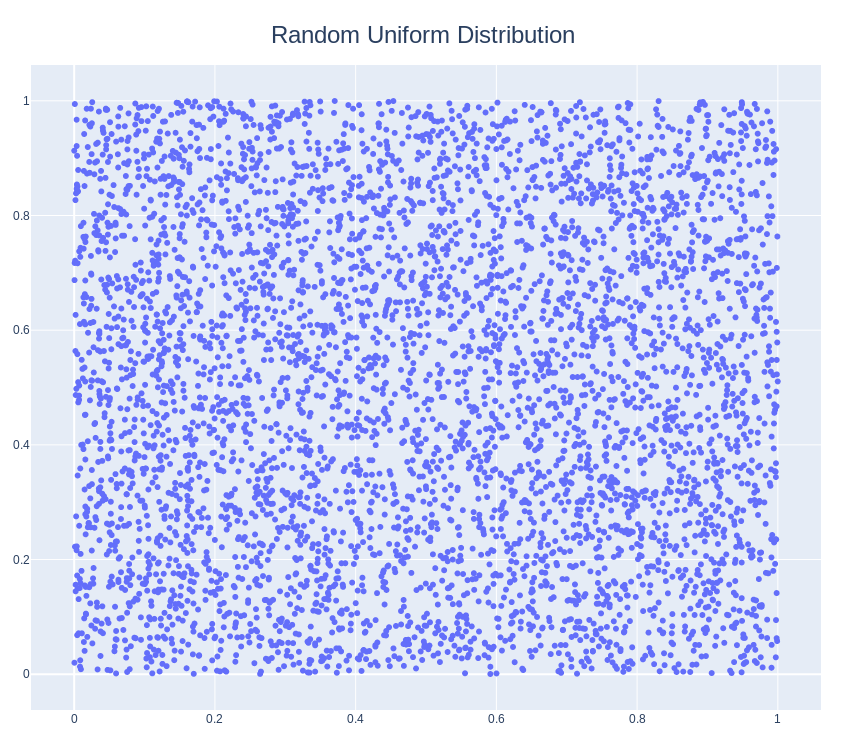

In [6]:
random_points = np.random.rand(5000, 2)
hyper_random_points = expand_data(random_points[:, 0], random_points[:, 1])
plot_embeddings(random_points[:, :2], None, 'plotly_figures/random.json', 'Random Uniform Distribution')

#### Ivis

In [7]:
start_time = time.time()
model = Ivis(embedding_dims=2, k=25, model='maaten')
random_point_embeddings = model.fit_transform(hyper_random_points)
ivis_time = time.time() - start_time
print(f'Ivis took {ivis_time:.4f} s.')
np.savetxt('data/random_ivis.csv', random_point_embeddings, delimiter=',')

  1%|          | 36/5000 [00:00<00:13, 358.46it/s]

Building KNN index


100%|██████████| 5000/5000 [00:00<00:00, 6520.81it/s]


Extracting KNN from index


100%|██████████| 5000/5000 [00:00<00:00, 18812.72it/s]

Instructions for updating:
If using Keras pass *_constraint arguments to layers.



Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Training neural network
Epoch 1/1000
39/39 [==============================] - 3s 89ms/step - loss: 0.4550
Epoch 2/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.2765
Epoch 3/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.2703
Epoch 4/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.2205
Epoch 5/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1797
Epoch 6/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1556
Epoch 7/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1313
Epoch 8/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1146
Epoch 9/1000
39/39 [==============================] - 1s 18ms/step - loss: 0.1215
Epoch 10/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1009
Epoch 11/1000
39/39 [==============================] - 1s 17ms/step - loss: 0.1132
Epoch 12/1000
39/39 [==============================] - 1s 17ms/step - lo

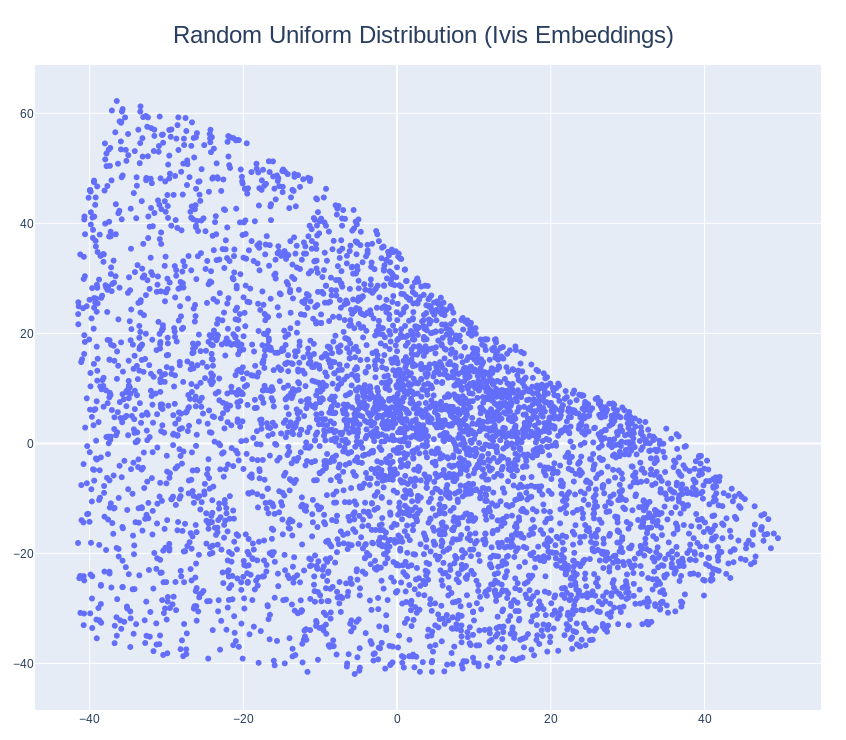

In [8]:
random_point_embeddings = RigidMotionAlignment().fit_transform(random_point_embeddings, random_points)
plot_embeddings(random_point_embeddings, None, 'plotly_figures/random_ivis.json', 'Random Uniform Distribution (Ivis Embeddings)')

#### UMAP

UMAP took 1.9792


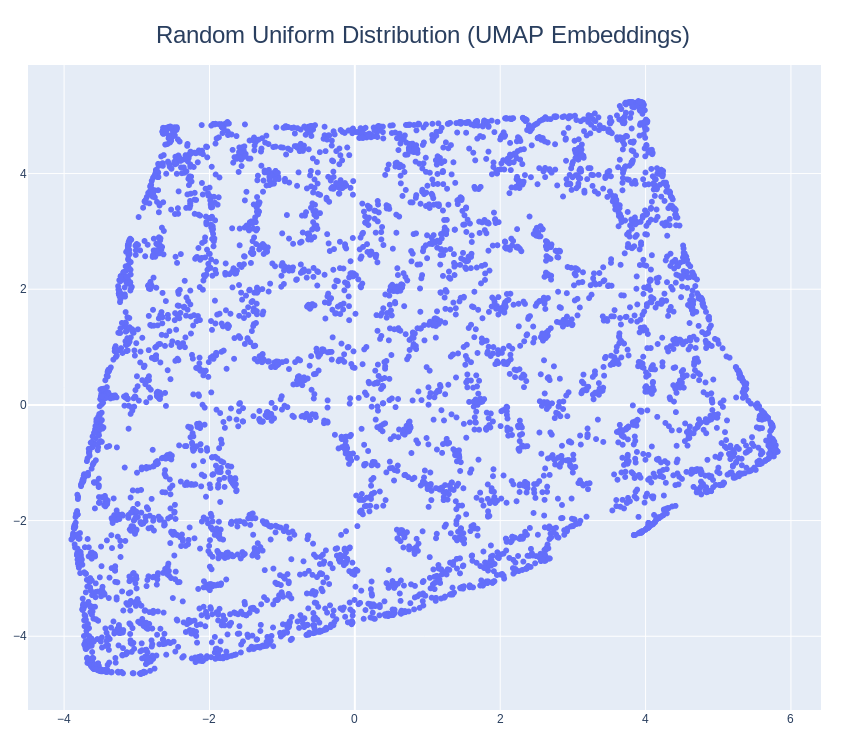

In [9]:
start_time = time.time()
um = UMAP(n_neighbors=25, n_epochs=1000, learning_rate=0.5, should_downcast=None)
random_point_um_embeddings = um.fit_transform(hyper_random_points, convert_dtype=True)
umap_time = time.time() - start_time
print(f'UMAP took {umap_time:.4f}')
np.savetxt('data/random_point_umap.csv', random_point_um_embeddings, delimiter=',')
random_point_um_embeddings = RigidMotionAlignment().fit_transform(random_point_um_embeddings, random_points)
plot_embeddings(random_point_um_embeddings, None, 'plotly_figures/random_umap.json', 'Random Uniform Distribution (UMAP Embeddings)')

### Smiley

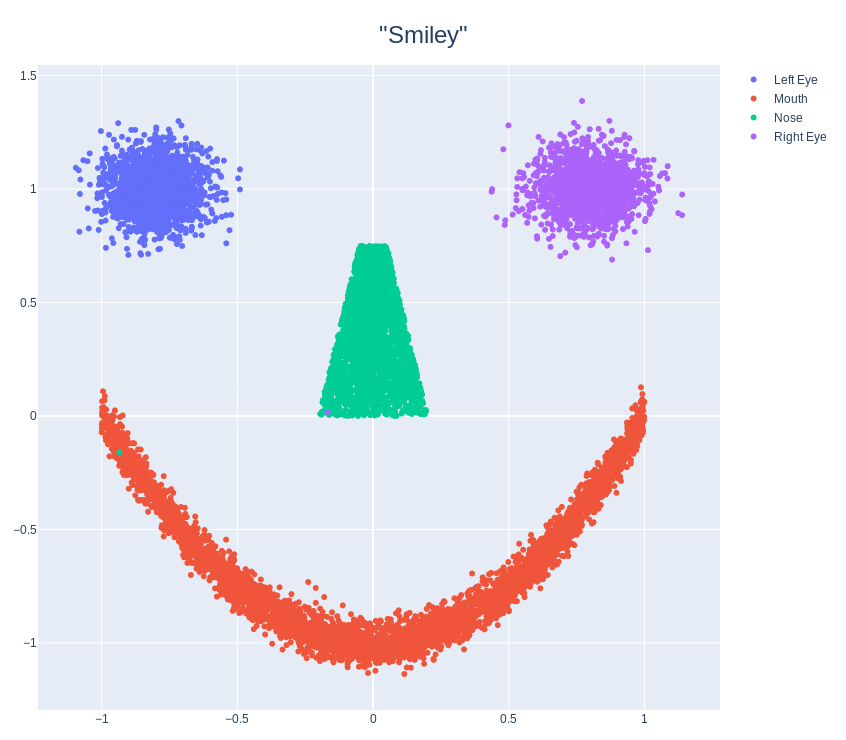

In [10]:
smiley = pd.read_csv('data/smiley.csv', index_col=0)
smiley = smiley.rename(columns={'x.x4': 'x', 'x.V2': 'y', 'classes': 'class'})
class_labels = {
    1: 'Left Eye',
    2: 'Right Eye',
    3: 'Nose',
    4: 'Mouth'
}
smiley['class'] = smiley['class'].apply(lambda x: class_labels[x])
hypersmiley = expand_data(smiley['x'], smiley['y'])
plot_embeddings(smiley[['x', 'y']].values, smiley['class'], 'plotly_figures/smiley.json', '"Smiley"')

#### Ivis

In [11]:
start_time = time.time()
model = Ivis(embedding_dims=2, k=25, model='maaten')
smiley_embeddings = model.fit_transform(hypersmiley)
ivis_time = time.time() - start_time
print(f'Ivis took {ivis_time:.4f} s.')
np.savetxt('data/smiley_ivis.csv', smiley_embeddings, delimiter=',')

  0%|          | 15/10000 [00:00<02:49, 59.03it/s]

Building KNN index


100%|██████████| 10000/10000 [00:00<00:00, 12423.65it/s]


Extracting KNN from index


100%|██████████| 10000/10000 [00:00<00:00, 22579.03it/s]


Training neural network
Epoch 1/1000
78/78 [==============================] - 4s 47ms/step - loss: 0.3061
Epoch 2/1000
78/78 [==============================] - 1s 16ms/step - loss: 0.2504
Epoch 3/1000
78/78 [==============================] - 1s 16ms/step - loss: 0.2156
Epoch 4/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1537
Epoch 5/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1270
Epoch 6/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1118
Epoch 7/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1169
Epoch 8/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0966
Epoch 9/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0903
Epoch 10/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0903
Epoch 11/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0959
Epoch 12/1000
78/78 [==============================] - 1s 15ms/step - lo

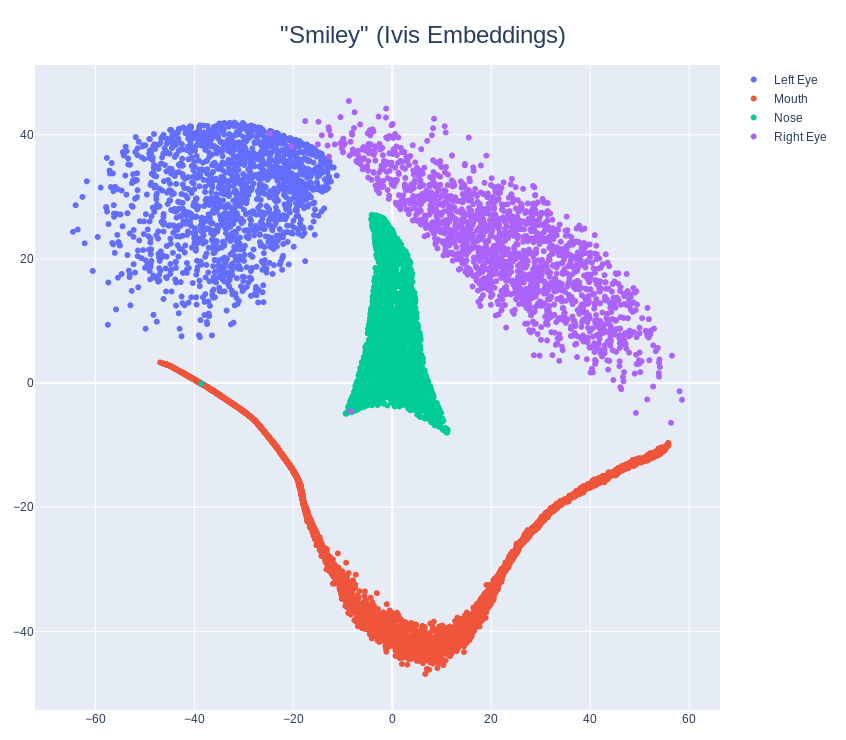

In [12]:
smiley_embeddings = RigidMotionAlignment().fit_transform(smiley_embeddings, smiley[['x', 'y']])
plot_embeddings(smiley_embeddings, smiley['class'], 'plotly_figures/smiley_ivis.json', '"Smiley" (Ivis Embeddings)')

#### UMAP

UMAP took 2.5154


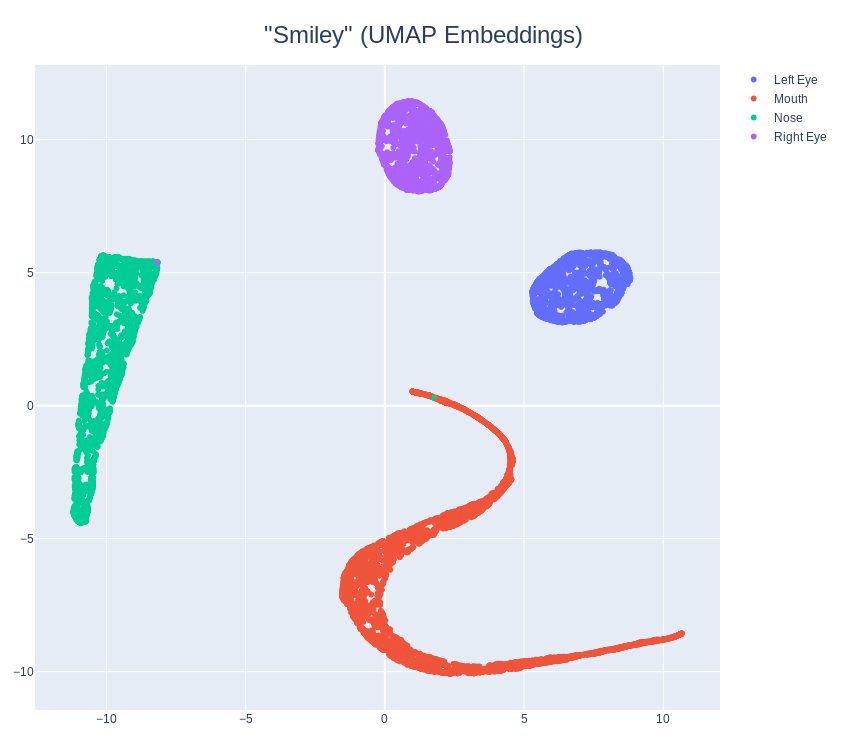

In [13]:
start_time = time.time()
um = UMAP(n_neighbors=25, n_epochs=1000, learning_rate=0.5, should_downcast=None)
smiley_um_embeddings = um.fit_transform(hypersmiley, convert_dtype=True)
umap_time = time.time() - start_time
print(f'UMAP took {umap_time:.4f}')
np.savetxt('data/smiley_umap.csv', smiley_um_embeddings, delimiter=',')
smiley_um_embeddings = RigidMotionAlignment().fit_transform(smiley_um_embeddings, smiley[['x', 'y']])
plot_embeddings(smiley_um_embeddings, smiley['class'], 'plotly_figures/smiley_umap.json', '"Smiley" (UMAP Embeddings)')

### Looser "connected" smiley

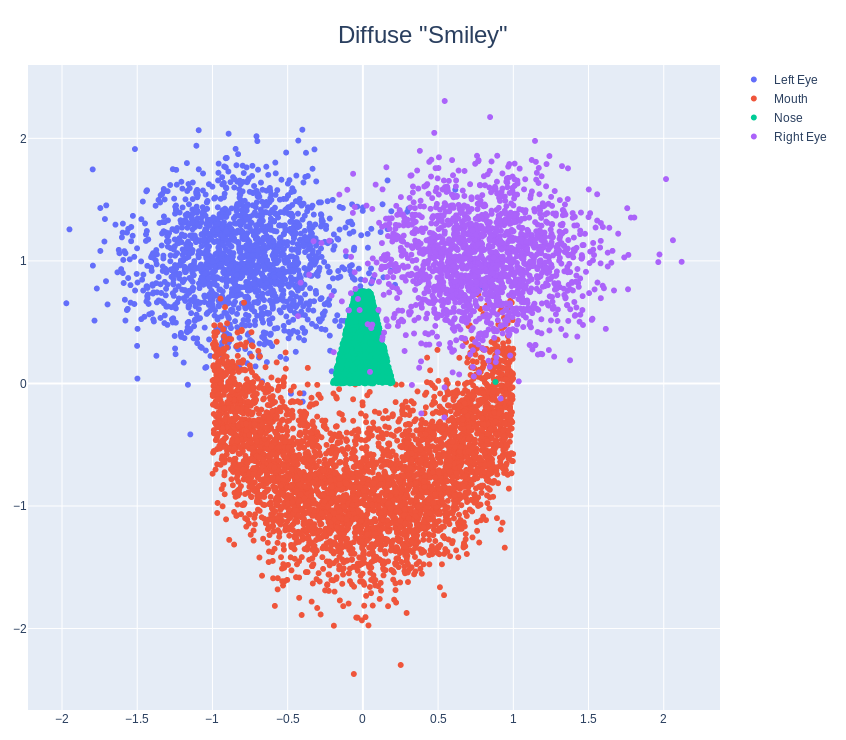

In [14]:
loose_smiley = pd.read_csv('data/loose_smiley.csv', index_col=0)
loose_smiley = loose_smiley.rename(columns={'x.x4': 'x', 'x.V2': 'y', 'classes': 'class'})
loose_hypersmiley = expand_data(loose_smiley['x'], loose_smiley['y'])
class_labels = {
    1: 'Left Eye',
    2: 'Right Eye',
    3: 'Nose',
    4: 'Mouth'
}
loose_smiley['class'] = loose_smiley['class'].apply(lambda x: class_labels[x])
plot_embeddings(loose_smiley[['x', 'y']].values, loose_smiley['class'],
                'plotly_figures/loose_smiley.json', 'Diffuse "Smiley"')

#### Ivis

In [15]:
start_time = time.time()
model = Ivis(embedding_dims=2, k=25, model='maaten')
loose_embeddings = model.fit_transform(loose_hypersmiley)
ivis_time = time.time() - start_time
print(f'Ivis took {ivis_time:.4f} s.')
np.savetxt('data/loose_smiley_ivis.csv', loose_embeddings, delimiter=',')

  0%|          | 6/10000 [00:00<02:55, 57.09it/s]

Building KNN index


100%|██████████| 10000/10000 [00:00<00:00, 24422.33it/s]


Extracting KNN from index


100%|██████████| 10000/10000 [00:00<00:00, 18738.02it/s]


Training neural network
Epoch 1/1000
78/78 [==============================] - 4s 56ms/step - loss: 0.2096
Epoch 2/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1785
Epoch 3/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1475
Epoch 4/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1039
Epoch 5/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0834
Epoch 6/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0798
Epoch 7/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0693
Epoch 8/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0752
Epoch 9/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0667
Epoch 10/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0678
Epoch 11/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0562
Epoch 12/1000
78/78 [==============================] - 1s 16ms/step - lo

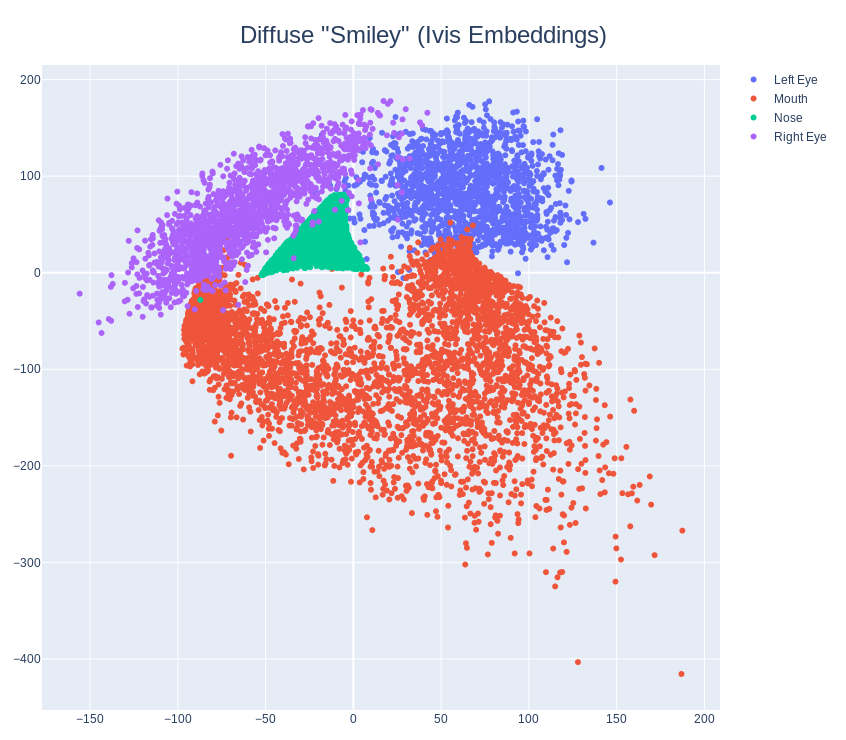

In [16]:
loose_embeddings = RigidMotionAlignment().fit_transform(loose_embeddings, loose_smiley[['x', 'y']])
plot_embeddings(loose_embeddings, loose_smiley['class'], 'plotly_figures/loose_smiley_ivis.json',
               'Diffuse "Smiley" (Ivis Embeddings)')

#### UMAP

In [17]:
start_time = time.time()
um = UMAP(n_neighbors=25, n_epochs=1000, learning_rate=0.5, should_downcast=None)
loose_um_embeddings = um.fit_transform(loose_hypersmiley, convert_dtype=True)
umap_eval_time = time.time() - start_time
print(f'UMAP took {umap_eval_time:.4f} s.')
np.savetxt('data/loose_smiley_umap.csv', loose_um_embeddings, delimiter=',')

UMAP took 2.1642 s.


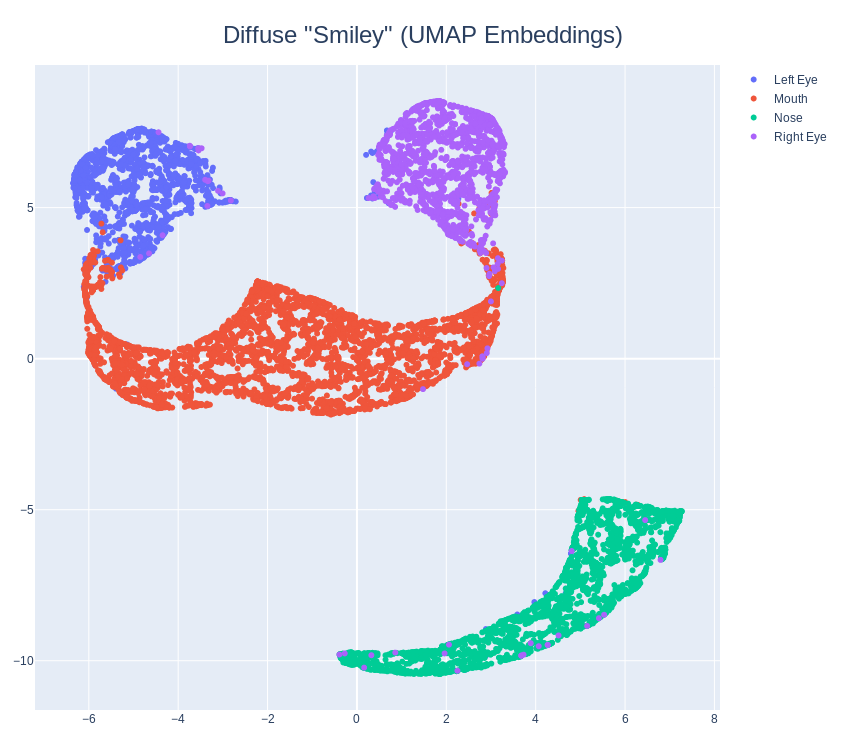

In [18]:
loose_um_embeddings = RigidMotionAlignment().fit_transform(loose_um_embeddings, loose_smiley[['x', 'y']])
plot_embeddings(loose_um_embeddings, loose_smiley['class'], 'plotly_figures/loose_smiley_umap.json',
               'Diffuse "Smiley" (UMAP Embeddings)')

### Cassini data

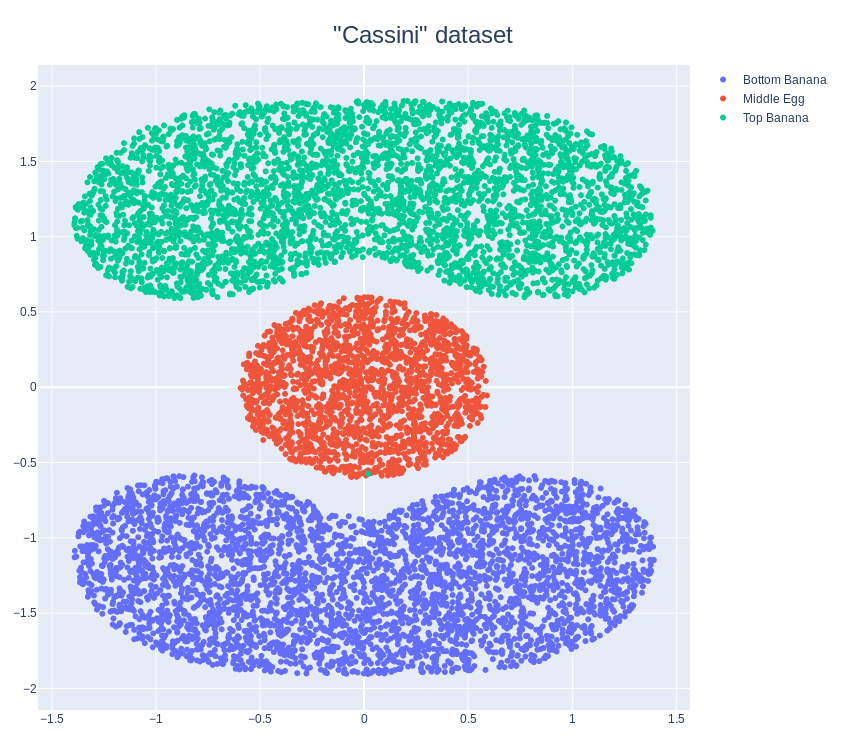

In [19]:
cassini = pd.read_csv('data/cassini.csv', index_col=0)
cassini = cassini.rename(columns={'x.1': 'x', 'x.2': 'y', 'classes': 'class'})
class_labels = {
    1: 'Bottom Banana',
    2: 'Top Banana',
    3: 'Middle Egg',
}
cassini['class'] = cassini['class'].apply(lambda x: class_labels[x])
plot_embeddings(cassini[['x', 'y']].values, cassini['class'], 'plotly_figures/cassini.json',
                '"Cassini" dataset')
hypercassini = expand_data(cassini['x'], cassini['y'])

#### Ivis

In [20]:
start_time = time.time()
model = Ivis(embedding_dims=2, k=25, model='maaten')
cassini_embeddings = model.fit_transform(hypercassini)
ivis_time = time.time() - start_time
print(f'Ivis took {ivis_time:.4f} s.')
np.savetxt('data/cassini_ivis.csv', cassini_embeddings, delimiter=',')

  0%|          | 36/10000 [00:00<00:28, 354.71it/s]

Building KNN index


100%|██████████| 10000/10000 [00:00<00:00, 27883.71it/s]


Extracting KNN from index


100%|██████████| 10000/10000 [00:00<00:00, 17843.58it/s]


Training neural network
Epoch 1/1000
78/78 [==============================] - 5s 66ms/step - loss: 0.1413
Epoch 2/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1378
Epoch 3/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.1025
Epoch 4/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0993
Epoch 5/1000
78/78 [==============================] - 1s 16ms/step - loss: 0.0791
Epoch 6/1000
78/78 [==============================] - 1s 16ms/step - loss: 0.0899
Epoch 7/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0580
Epoch 8/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0480
Epoch 9/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0487
Epoch 10/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0565
Epoch 11/1000
78/78 [==============================] - 1s 15ms/step - loss: 0.0575
Epoch 12/1000
78/78 [==============================] - 1s 15ms/step - lo

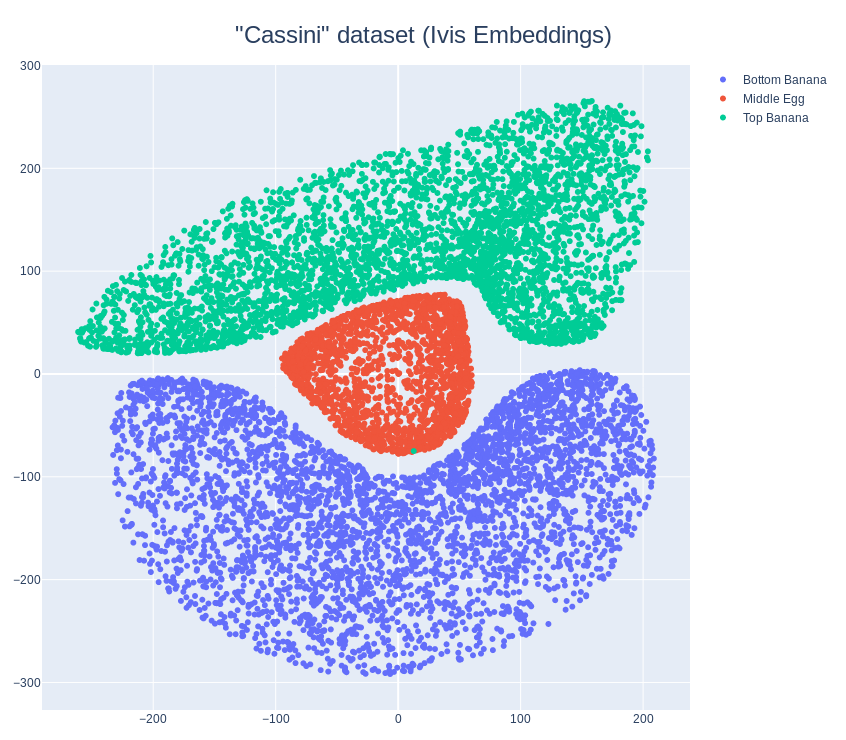

In [21]:
cassini_embeddings = RigidMotionAlignment().fit_transform(cassini_embeddings, cassini[['x', 'y']])
plot_embeddings(cassini_embeddings, cassini['class'], 'plotly_figures/cassini_ivis.json',
               '"Cassini" dataset (Ivis Embeddings)')

#### UMAP

In [22]:
start_time = time.time()
um = UMAP(n_neighbors=25, n_epochs=1000, learning_rate=0.5, should_downcast=None)
cassini_um_embeddings = um.fit_transform(hypercassini, convert_dtype=True)
umap_eval_time = time.time() - start_time
print(f'UMAP took {umap_eval_time:.4f} s.')
np.savetxt('data/cassini_umap.csv', cassini_um_embeddings, delimiter=',')

UMAP took 2.5022 s.


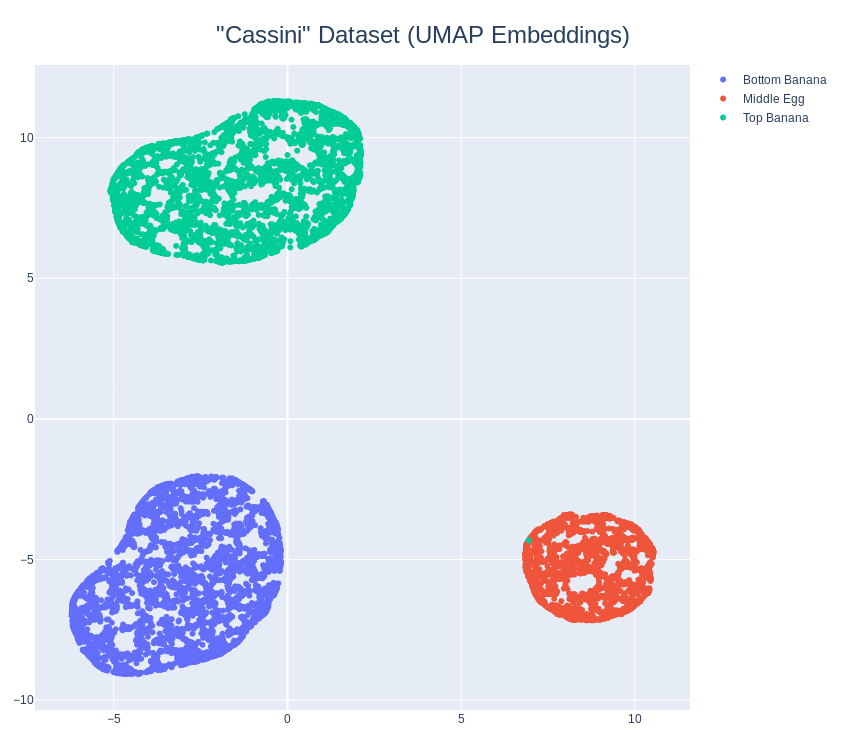

In [23]:
cassini_um_embeddings = RigidMotionAlignment().fit_transform(cassini_um_embeddings, cassini[['x', 'y']])
plot_embeddings(cassini_um_embeddings, cassini['class'], 'plotly_figures/cassini_umap.json',
               '"Cassini" Dataset (UMAP Embeddings)')

### PBMC dataset
#### PCA and PhenoGraph clustering

In [24]:
from sklearn.decomposition import PCA
import phenograph
pbmc = pd.read_csv('data/PBMC.csv', index_col=0)
# PCA to reduce dimensionality to the number of samples
pca = PCA()
pbmc_pca = pca.fit_transform(pbmc.values)
communities, graph, Q = phenograph.cluster(pbmc_pca)
np.savetxt('data/pbmc_pca.csv', pbmc_pca, delimiter=',')
np.savetxt('data/pbmc_communities.csv', communities, delimiter=',')

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 6.085032939910889 seconds
Jaccard graph constructed in 1.7965986728668213 seconds
Wrote graph to binary file in 0.5469536781311035 seconds
Running Louvain modularity optimization
stdout from convert: 
stderr from convert: [NVBLAS] NVBLAS_CONFIG_FILE environment variable is set to '/etc/jupyter/nvblas.conf'
[NVBLAS] Cannot Log File '/usr/local/share/jupyter/nvblas.log'
[NVBLAS] Config parsed

After 1 runs, maximum modularity is Q = 0.455387
Louvain completed 21 runs in 12.33976697921753 seconds
PhenoGraph complete in 20.895339250564575 seconds


#### PC score/score plots

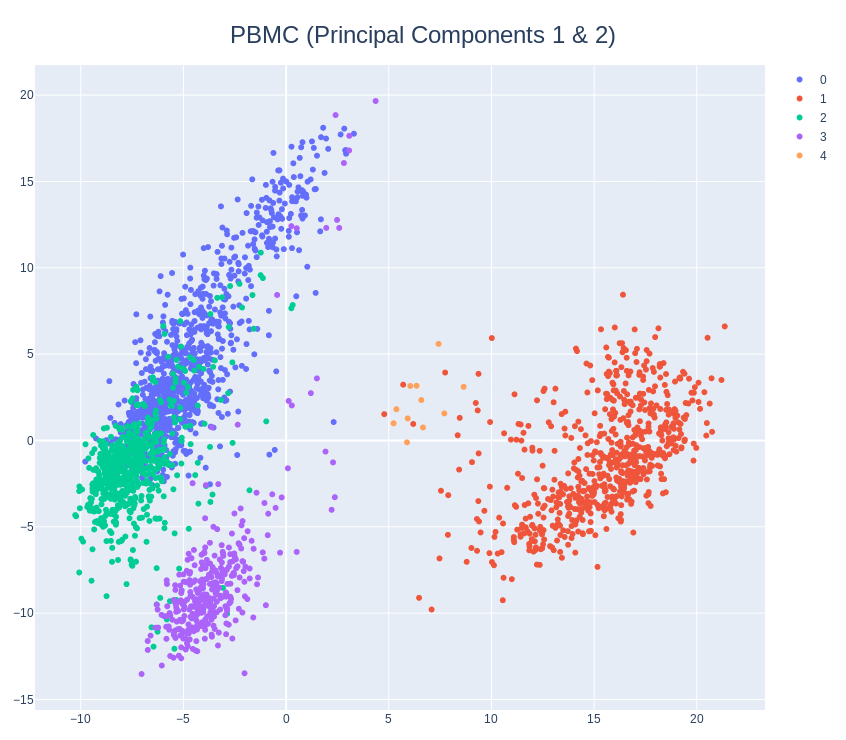

In [25]:
plot_embeddings(pbmc_pca[:, :2], communities, 'plotly_figures/pbmc.json', 'PBMC (Principal Components 1 & 2)')

#### Ivis

In [26]:
start_time = time.time()
model = Ivis(embedding_dims=2, k=25, model='maaten')
pbmc_embeddings = model.fit_transform(pbmc_pca)
ivis_time = time.time() - start_time
print(f'Ivis took {ivis_time:.4f} s.')
np.savetxt('data/pbmc_ivis.csv', pbmc_embeddings, delimiter=',')

  1%|          | 18/2695 [00:00<00:14, 179.07it/s]

Building KNN index


100%|██████████| 2695/2695 [00:02<00:00, 1252.90it/s]

Extracting KNN from index



100%|██████████| 2695/2695 [00:00<00:00, 5273.46it/s] 


Training neural network
Epoch 1/1000
21/21 [==============================] - 5s 251ms/step - loss: 2.4785
Epoch 2/1000
21/21 [==============================] - 1s 24ms/step - loss: 2.3156
Epoch 3/1000
21/21 [==============================] - 1s 24ms/step - loss: 2.4285
Epoch 4/1000
21/21 [==============================] - 1s 24ms/step - loss: 2.0652
Epoch 5/1000
21/21 [==============================] - 1s 25ms/step - loss: 1.8489
Epoch 6/1000
21/21 [==============================] - 1s 24ms/step - loss: 1.4988
Epoch 7/1000
21/21 [==============================] - 1s 24ms/step - loss: 1.1594
Epoch 8/1000
21/21 [==============================] - 0s 24ms/step - loss: 1.0311
Epoch 9/1000
21/21 [==============================] - 1s 25ms/step - loss: 0.8394
Epoch 10/1000
21/21 [==============================] - 1s 24ms/step - loss: 0.9156
Epoch 11/1000
21/21 [==============================] - 1s 24ms/step - loss: 0.6343
Epoch 12/1000
21/21 [==============================] - 1s 24ms/step - l

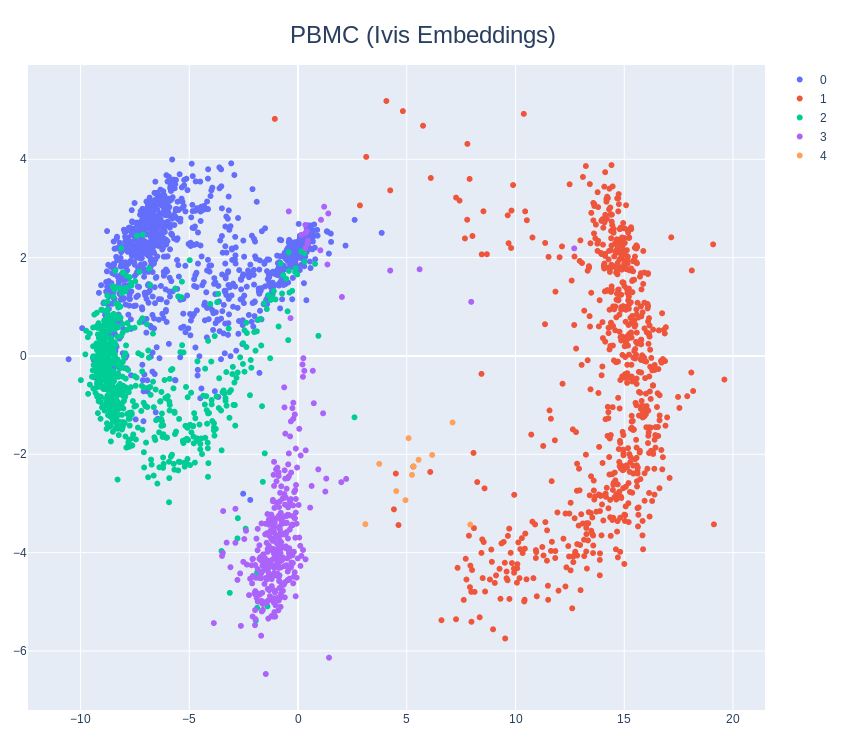

In [27]:
pbmc_embeddings = RigidMotionAlignment().fit_transform(pbmc_embeddings, pbmc_pca[:, :2])
plot_embeddings(pbmc_embeddings, communities, 'plotly_figures/pbmc_ivis.json', 'PBMC (Ivis Embeddings)')

#### UMAP

In [28]:
start_time = time.time()
um = UMAP(n_neighbors=25, n_epochs=1000, learning_rate=0.5, should_downcast=None)
pbmc_um_embeddings = um.fit_transform(pbmc_pca, convert_dtype=True)
umap_eval_time = time.time() - start_time
print(f'UMAP took {umap_eval_time:.4f} s.')
np.savetxt('data/pbmc_umap.csv', pbmc_um_embeddings, delimiter=',')

UMAP took 1.0343 s.


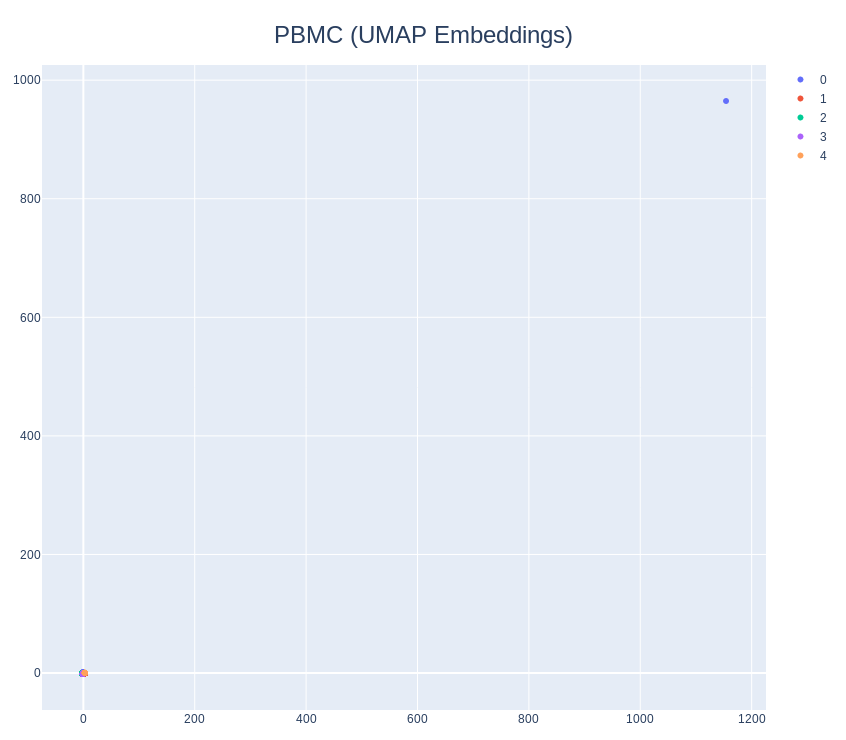

In [29]:
pbmc_um_embeddings = RigidMotionAlignment().fit_transform(pbmc_um_embeddings, pbmc_pca[:, :2])
plot_embeddings(pbmc_um_embeddings, communities, 'plotly_figures/pbmc_umap.json', 'PBMC (UMAP Embeddings)')

In [32]:
pbmc_um_embeddings

858